# Comparing different datasets, sample level, T-cells

- Raw protein data is used in comparisons of surface markers between different datasets in this notebook
- focusing on T-cells 

Datasets:

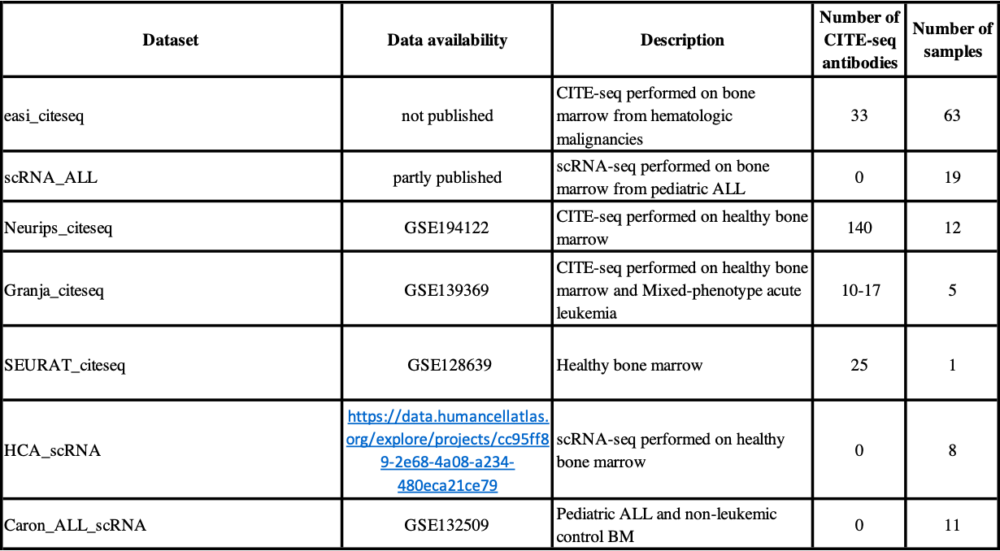

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



## File preparations

In [34]:
#raw protein data, all datasets

adata = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/healthy_malig_!m.h5ad')


### Neurips

In [35]:
#Neurips

adata_n=adata[adata.obs['batch_group'] == 'Neurips' ]

adata_n

View of AnnData object with n_obs × n_vars = 80998 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression'
    obsp: 'connectivities', 'distances'

In [36]:
adata_n.obs['DIAGNOSIS'] 

GTAGTACCAATCCTTT-1-s4d1    healthy
CTCAAGAGTCACAGAG-1-s4d1    healthy
CTGTGGGTCATGCGGC-1-s4d1    healthy
CGTGATAGTTATCTGG-1-s4d1    healthy
AGATCCAAGATCGGTG-1-s4d1    healthy
                            ...   
GTGGTTAGTCGAGTTT-1-s1d3    healthy
GCTACAACAGTGCGCT-1-s1d3    healthy
AACAAAGGTTGGTACT-1-s1d3    healthy
TGACAGTCATGGCTGC-1-s1d3    healthy
CTGGCAGGTCTCACGG-1-s1d3    healthy
Name: DIAGNOSIS, Length: 80998, dtype: category
Categories (1, object): ['healthy']

In [37]:
adata_n.obs['new_cell_type'].unique()

['NK', 'T', 'Prog', 'Myel', 'B', 'DC', 'E', 'Normoblast']
Categories (8, object): ['B', 'DC', 'E', 'Myel', 'NK', 'Normoblast', 'Prog', 'T']

In [38]:
#Select only T-cells

neurips_tcell=adata_n[adata_n.obs['new_cell_type'] == 'T' ]

In [39]:
neurips_tcell

View of AnnData object with n_obs × n_vars = 26775 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression'
    obsp: 'connectivities', 'distances'

In [40]:
neurips_tcell_prot=neurips_tcell.obsm['protein_expression']

In [41]:
neurips_tcell_prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
CTCAAGAGTCACAGAG-1-s4d1,2,10,47,4,18,73,146,9,52,23,...,51,11,19,0,0,0,0,0,0,0
AAGCCATCATAATCCG-1-s4d1,2,16,38,5,19,171,124,9,55,120,...,21,31,80,0,0,0,0,0,0,0
TAGATCGCAGCCTTCT-1-s4d1,0,14,36,5,14,48,75,9,42,17,...,42,18,13,0,0,0,0,0,0,0
TGGAGGACAAGATCCT-1-s4d1,6,5,41,4,15,85,95,8,48,28,...,15,22,20,0,0,0,0,0,0,0
ATCTTCATCCCTCGAT-1-s4d1,1,12,27,7,10,135,152,10,68,68,...,14,19,22,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTGGTTAGTCGAGTTT-1-s1d3,0,1,12,0,4,70,66,3,9,58,...,7,6,6,0,0,0,0,0,0,0
GCTACAACAGTGCGCT-1-s1d3,1,3,16,0,7,54,97,3,13,58,...,32,13,7,0,0,0,0,0,0,0
AACAAAGGTTGGTACT-1-s1d3,1,2,22,1,3,180,205,3,18,120,...,28,8,4,0,0,0,0,0,0,0
TGACAGTCATGGCTGC-1-s1d3,1,6,13,1,1,83,128,1,11,44,...,21,9,15,0,0,0,0,0,0,0


In [42]:
#To exclude columns that contain only zeros

neurips_tcell_prot = pd.DataFrame(neurips_tcell_prot)
neurips_tcell_prot != 0
(neurips_tcell_prot != 0).any(axis=0)
neurips_tcell_prot.loc[:, (neurips_tcell_prot != 0).any(axis=0)]
neurips_tcell_prot = neurips_tcell_prot.loc[:, (neurips_tcell_prot != 0).any(axis=0)]

for col in neurips_tcell_prot:
    print(col)

CD86
CD274
CD270
CD155
CD112
CD47
CD48
CD40
CD154
CD52
CD3
CD8
CD56
CD19
CD33
CD11c
HLA-A-B-C
CD45RA
CD123
CD7
CD105
CD49f
CD194
CD4
CD44
CD14
CD16
CD25
CD45RO
CD279
TIGIT
CD20
CD335
CD31
Podoplanin
CD146
IgM
CD5
CD195
CD32
CD196
CD185
CD103
CD69
CD62L
CD161
CD152
CD223
KLRG1
CD27
CD107a
CD95
CD134
HLA-DR
CD1c
CD11b
CD64
CD141
CD1d
CD314
CD35
CD57
CD272
CD278
CD58
CD39
CX3CR1
CD24
CD21
CD11a
CD79b
CD244
CD169
integrinB7
CD268
CD42b
CD54
CD62P
CD119
TCR
CD192
CD122
FceRIa
CD41
CD137
CD163
CD83
CD124
CD13
CD2
CD226
CD29
CD303
CD49b
CD81
IgD
CD18
CD28
CD38
CD127
CD45
CD22
CD71
CD26
CD115
CD63
CD304
CD36
CD172a
CD72
CD158
CD93
CD49a
CD49d
CD73
CD9
TCRVa7.2
TCRVd2
LOX-1
CD158b
CD158e1
CD142
CD319
CD352
CD94
CD162
CD85j
CD23
CD328
HLA-E
CD82
CD101
CD88
CD224


### Granja

In [43]:
adata_granja=adata[adata.obs['batch_group'] == 'Granja' ]

adata_granja

View of AnnData object with n_obs × n_vars = 24204 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression'
    obsp: 'connectivities', 'distances'

In [44]:
adata_granja.obs['DIAGNOSIS'] 

BMMC_D1T1:AAACCCAAGATGCAGC-1    healthy
BMMC_D1T1:AAACCCACAAACTCGT-1    healthy
BMMC_D1T1:AAACCCACAGTGTACT-1    healthy
BMMC_D1T1:AAACCCATCGCTATTT-1    healthy
BMMC_D1T1:AAACGAACACCCAATA-1    healthy
                                 ...   
MPAL5_T1:TTTGTCAAGCGTGAGT-1        MPAL
MPAL5_T1:TTTGTCACACGTCAGC-1        MPAL
MPAL5_T1:TTTGTCACATCGTCGG-1        MPAL
MPAL5_T1:TTTGTCACATTTCACT-1        MPAL
MPAL5_T1:TTTGTCATCGTAGGAG-1        MPAL
Name: DIAGNOSIS, Length: 24204, dtype: category
Categories (2, object): ['MPAL', 'healthy']

In [45]:
adata_granja.obs['cell_type'].unique().to_list()

['CD4+ T 1',
 'CD14+ monocyte 1',
 'Pre B',
 'Pro B',
 'CD8+ T',
 'Promonocyte',
 'CD14+ monocyte 2',
 'Plasmacytoid dendritic cell',
 'NK T 2',
 'Immature B',
 'Late erythoid precursor 1',
 'Pre B (cycling)',
 'NK',
 'Late erythoid precursor 3',
 'Early erythoid precursor',
 'CD16+ monocyte',
 'Conventional dendritic cell',
 'HSC',
 'NK T 1',
 'Late erythoid precursor 2',
 'Plasma B cell',
 'Stromal cell',
 'Megakaryocyte',
 nan]

In [46]:
#Select T-cells
granja_tcell=adata_granja[adata_granja.obs['new_cell_type'] == 'T' ]

In [47]:
granja_tcell

View of AnnData object with n_obs × n_vars = 4489 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression'
    obsp: 'connectivities', 'distances'

In [48]:
granja_tcell_prot=granja_tcell.obsm['protein_expression']

granja_tcell_prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
BMMC_D1T1:AAACCCAAGATGCAGC-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,34,0,0
BMMC_D1T1:AAACGAACAGCAGTCC-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,44,0,0
BMMC_D1T1:AAACGAACATGACGAG-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,64,0,0
BMMC_D1T1:AAACGAATCAAGCCAT-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,45,0,0
BMMC_D1T1:AAACGCTAGCCGTAAG-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,58,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BMMC_D1T2:TTTGGTTGTCTTCATT-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,36,0,0
BMMC_D1T2:TTTGGTTTCACGATCA-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,44,0,0
BMMC_D1T2:TTTGGTTTCCACATAG-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,33,0,0
BMMC_D1T2:TTTGTTGCAGTGGTGA-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,38,0,0


In [49]:
#To exclude columns that contain only zeros

granja_tcell_prot = pd.DataFrame(granja_tcell_prot)
granja_tcell_prot != 0
(granja_tcell_prot != 0).any(axis=0)
granja_tcell_prot.loc[:, (granja_tcell_prot != 0).any(axis=0)]
granja_tcell_prot = granja_tcell_prot.loc[:, (granja_tcell_prot != 0).any(axis=0)]

for col in granja_tcell_prot:
    print(col)

CD3
CD8
CD56
CD19
CD45RA
CD4
CD14
CD16
CD25
CD45RO
CD279
TIGIT
CD127
CD15


### Easigenomics

### Comments:

- Only NKT annotation available (NK- + T-cells)

In [50]:

adata_f=adata[adata.obs['batch_group'] == 'Easi' ]

adata_f

View of AnnData object with n_obs × n_vars = 121340 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression'
    obsp: 'connectivities', 'distances'

In [51]:
adata_f.obs['DIAGNOSIS'] 

AAACCTGAGCCCTAAT-1-100    Aplastic anemia
AAACCTGCAAGCCGCT-1-100    Aplastic anemia
AAACCTGCACTGTCGG-1-100    Aplastic anemia
AAACCTGCAGACGCTC-1-100    Aplastic anemia
AAACCTGTCCTTAATC-1-100    Aplastic anemia
                               ...       
TTTGTCAGTACATCCA-1-158              B-ALL
TTTGTCAGTAGGCATG-1-158              B-ALL
TTTGTCAGTATGCTTG-1-158              B-ALL
TTTGTCATCAAACCAC-1-158              B-ALL
TTTGTCATCCATGAAC-1-158              B-ALL
Name: DIAGNOSIS, Length: 121340, dtype: category
Categories (10, object): ['AML', 'Aplastic anemia', 'B-ALL', 'Blastic plasmacytoid dendritic cell leukemia', ..., 'Multiple myeloma', 'Plasma cell leukemia', 'RAEB-2', 'T-ALL']

In [52]:
adata_f.obs['cell_type'].unique().to_list()

['NKT',
 'non-leukemic',
 'preleukemic',
 'non-leukemic?',
 nan,
 'leukemic',
 'leukemic?',
 'doublets?',
 'unknown',
 '0',
 'preleukemic?']

In [53]:
#Select NK + T

easi_nkt=adata_f[adata_f.obs['cell_type'] == 'NKT' ]

In [54]:
easi_nkt

View of AnnData object with n_obs × n_vars = 27738 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression'
    obsp: 'connectivities', 'distances'

In [55]:
easi_nkt_prot=easi_nkt.obsm['protein_expression']

easi_nkt_prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
AAACCTGAGCCCTAAT-1-100,0,0,0,0,0,0,0,0,0,0,...,0,0,0,17,25,17,0,43,11,25
AAACCTGCAGACGCTC-1-100,0,0,0,0,0,0,0,0,0,0,...,0,0,0,28,34,12,0,51,14,21
AAACCTGTCCTTAATC-1-100,0,0,0,0,0,0,0,0,0,0,...,0,0,0,20,27,16,0,30,10,17
AAACGGGGTCTCTCGT-1-100,0,0,0,0,0,0,0,0,0,0,...,0,0,0,22,21,19,0,43,7,25
AAAGATGTCCAGTAGT-1-100,0,0,0,0,0,0,0,0,0,0,...,0,0,0,19,22,7,0,47,14,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTAGGCACAGAAGCAC-1-158,0,0,0,0,0,0,0,0,0,0,...,0,0,0,4,15,105,0,9,4,4
TTCTACAGTGAGCGAT-1-158,0,0,0,0,0,0,0,0,0,0,...,0,0,0,4,11,68,0,7,1,7
TTGAACGAGCGGATCA-1-158,0,0,0,0,0,0,0,0,0,0,...,0,0,0,5,10,40,0,6,1,9
TTGCCGTAGATCCGAG-1-158,0,0,0,0,0,0,0,0,0,0,...,0,0,0,4,23,151,0,11,4,8


In [56]:
#To exclude columns that contain only zeros

easi_nkt_prot = pd.DataFrame(easi_nkt_prot)
easi_nkt_prot != 0
(easi_nkt_prot != 0).any(axis=0)
easi_nkt_prot.loc[:, (easi_nkt_prot != 0).any(axis=0)]
easi_nkt_prot = easi_nkt_prot.loc[:, (easi_nkt_prot != 0).any(axis=0)]

for col in easi_nkt_prot:
    print(col)

CD3
CD8
CD56
CD19
CD33
CD11c
CD45RA
CD123
CD7
CD4
CD44
CD14
CD45RO
CD20
CD5
HLA-DR
CD11b
CD64
CD58
CD24
CD13
CD2
CD81
CD38
CD127
CD45
CD73
CD197
CD34
CD10
CD15
CD117
CD66ace


### Seurat 

In [57]:
#Seurat

adata_s=adata[adata.obs['batch_group'] == 'Seurat' ]

adata_s

View of AnnData object with n_obs × n_vars = 29556 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression'
    obsp: 'connectivities', 'distances'

In [58]:
adata_s.obs['DIAGNOSIS'] 

a_AAACCTGAGCTTATCG-1    healthy
a_AAACCTGAGGTGGGTT-1    healthy
a_AAACCTGAGTACATGA-1    healthy
a_AAACCTGCAAACCTAC-1    healthy
a_AAACCTGCAAGGTGTG-1    healthy
                         ...   
b_TTTGTCATCCGAGCCA-1    healthy
b_TTTGTCATCCGTAGGC-1    healthy
b_TTTGTCATCCTCGCAT-1    healthy
b_TTTGTCATCGCCGTGA-1    healthy
b_TTTGTCATCGTTTGCC-1    healthy
Name: DIAGNOSIS, Length: 29556, dtype: category
Categories (1, object): ['healthy']

In [59]:
adata_s.obs['cell_type'].unique().to_list()

['Prog_RBC',
 'gdT',
 'CD4 Naive',
 'CD4 Memory',
 'CD14 Mono',
 'Naive B',
 'CD8 Naive',
 'Treg',
 'CD8 Effector_2',
 'NK',
 'GMP',
 'CD8 Effector_1',
 'CD16 Mono',
 'pDC',
 'CD8 Memory_1',
 'MAIT',
 'Memory B',
 'cDC2',
 'CD56 bright NK',
 'Prog_B 2',
 'Prog_Mk',
 'CD8 Memory_2',
 'Plasmablast',
 'HSC',
 'LMPP',
 'Prog_DC',
 'Prog_B 1']

In [60]:
#Select T-cells

seurat_tcell=adata_s[adata_s.obs['new_cell_type'] == 'T' ]

In [61]:
seurat_tcell

View of AnnData object with n_obs × n_vars = 14664 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression'
    obsp: 'connectivities', 'distances'

In [62]:
seurat_tcell_prot=seurat_tcell.obsm['protein_expression']

seurat_tcell_prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
a_AAACCTGAGGTGGGTT-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,4,0,0,0,0,0
a_AAACCTGAGTACATGA-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,4,4,0,0,0,0,0
a_AAACCTGCAAACCTAC-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,12,7,0,0,0,0,0
a_AAACCTGCACTTGGAT-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,17,1,0,0,0,0,0
a_AAACCTGCAGGCAGTA-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,10,6,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b_TTTGTCATCATAGCAC-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,17,11,0,0,0,0,0
b_TTTGTCATCCGAGCCA-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,12,11,0,0,0,0,0
b_TTTGTCATCCGTAGGC-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,24,12,0,0,0,0,0
b_TTTGTCATCGCCGTGA-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,40,30,0,0,0,0,0


In [63]:
#To exclude columns that contain only zeros

seurat_tcell_prot = pd.DataFrame(seurat_tcell_prot)
seurat_tcell_prot != 0
(seurat_tcell_prot != 0).any(axis=0)
seurat_tcell_prot.loc[:, (seurat_tcell_prot != 0).any(axis=0)]
seurat_tcell_prot = seurat_tcell_prot.loc[:, (seurat_tcell_prot != 0).any(axis=0)]

for col in seurat_tcell_prot:
    print(col)

CD3
CD8
CD56
CD19
CD11c
CD45RA
CD123
CD4
CD14
CD16
CD25
CD45RO
CD69
CD161
CD27
HLA-DR
CD57
CD278
CD11a
CD79b
CD28
CD38
CD127
CD197
CD34


## Comparisons

### Neurips

In [64]:
samples=adata_n.obs['POOL'].unique().tolist()
samples

['s4d1',
 's3d6',
 's1d2',
 's2d1',
 's3d7',
 's2d4',
 's1d1',
 's4d9',
 's4d8',
 's2d5',
 's3d1',
 's1d3']

In [65]:
#save means of protein counts/each protein/each sample into a list

list_samples= []

for sample in samples:
    eg=adata_n[adata_n.obs['new_cell_type'] == 'T']
    eg=adata_n[adata_n.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples.append(prot_mean)

    

In [66]:
list_samples

[CD66ace      0.000000
 CD15         0.000000
 CD90         0.000000
 CD10         0.000000
 CD34         0.000000
               ...    
 CD45RA     146.030911
 CD71       180.725691
 CD45       185.177892
 CD44       195.542068
 CD11a      223.299898
 Length: 141, dtype: float64,
 CD66ace     0.000000
 CD15        0.000000
 CD90        0.000000
 CD10        0.000000
 CD34        0.000000
              ...    
 CD154      11.512408
 CD95       12.613513
 CD141      12.710159
 CD45RA     15.661981
 CD71       59.957736
 Length: 141, dtype: float64,
 CD66ace      0.000000
 CD117        0.000000
 CD15         0.000000
 CD90         0.000000
 CD10         0.000000
               ...    
 CD48       187.255955
 CD44       205.419326
 CD11a      267.175506
 CD45       277.178652
 CD45RA     388.055056
 Length: 141, dtype: float64,
 CD66ace      0.000000
 CD15         0.000000
 CD90         0.000000
 CD10         0.000000
 CD34         0.000000
               ...    
 CD45        17.476766
 

In [67]:
#save column names
proteins=adata_n.obsm['protein_expression'].columns

In [68]:
#creating a dataframe from list of lists

df = pd.DataFrame(list_samples, columns = proteins)

df

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
0,7.613715,13.013715,36.935312,5.395701,20.699488,125.103173,119.787308,14.011873,55.006960,55.956807,...,36.151894,36.502968,32.954555,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.886099,2.501066,6.505913,1.493117,4.406359,6.660043,7.898798,2.313784,11.512408,3.416053,...,4.788872,6.208802,4.918476,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,14.040899,3.723820,22.388989,6.616180,8.660674,163.567865,187.255955,10.939775,17.008539,77.682921,...,66.600225,37.424944,28.854831,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.122470,8.529740,4.432363,1.264560,2.525506,15.438971,18.466439,2.254544,5.353573,6.173482,...,9.849133,8.429988,6.429678,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.536845,1.551009,5.633494,2.030920,3.710146,8.517219,9.948435,2.217275,9.432327,4.513979,...,9.712924,6.274394,7.035364,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,2.190383,7.514754,8.909508,2.504918,6.245027,22.976393,23.648743,3.456831,11.463388,9.772896,...,10.178579,10.095519,10.735738,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,11.049964,3.873636,26.381033,5.358234,9.848169,198.427601,189.397284,20.707737,18.600534,77.458889,...,55.944215,37.681785,38.227747,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,2.528561,33.350343,24.125057,3.325666,10.811577,107.669612,76.664433,8.390861,23.691241,69.322468,...,12.097791,19.661538,21.114851,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,14.766620,11.894201,40.146252,6.594342,17.675813,298.876096,301.074399,21.226025,35.819519,163.931825,...,56.562093,50.831400,44.364639,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,1.983152,2.254785,5.104069,1.331117,4.105788,20.856848,29.825673,2.651461,5.693066,8.797364,...,16.792321,5.763209,8.585559,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [69]:
df=df.T

df

,0,1,2,3,4,5,6,7,8,9,10,11
CD86,7.613715,0.886099,14.040899,1.122470,1.536845,2.190383,11.049964,2.528561,14.766620,1.983152,3.055791,4.265432
CD274,13.013715,2.501066,3.723820,8.529740,1.551009,7.514754,3.873636,33.350343,11.894201,2.254785,5.956240,4.049383
CD270,36.935312,6.505913,22.388989,4.432363,5.633494,8.909508,26.381033,24.125057,40.146252,5.104069,19.619604,23.172840
CD155,5.395701,1.493117,6.616180,1.264560,2.030920,2.504918,5.358234,3.325666,6.594342,1.331117,3.589998,4.153498
CD112,20.699488,4.406359,8.660674,2.525506,3.710146,6.245027,9.848169,10.811577,17.675813,4.105788,12.610521,8.136831
...,...,...,...,...,...,...,...,...,...,...,...,...
CD10,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD90,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD15,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD117,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [70]:
#add column names

df.columns=samples

df

,s4d1,s3d6,s1d2,s2d1,s3d7,s2d4,s1d1,s4d9,s4d8,s2d5,s3d1,s1d3
CD86,7.613715,0.886099,14.040899,1.122470,1.536845,2.190383,11.049964,2.528561,14.766620,1.983152,3.055791,4.265432
CD274,13.013715,2.501066,3.723820,8.529740,1.551009,7.514754,3.873636,33.350343,11.894201,2.254785,5.956240,4.049383
CD270,36.935312,6.505913,22.388989,4.432363,5.633494,8.909508,26.381033,24.125057,40.146252,5.104069,19.619604,23.172840
CD155,5.395701,1.493117,6.616180,1.264560,2.030920,2.504918,5.358234,3.325666,6.594342,1.331117,3.589998,4.153498
CD112,20.699488,4.406359,8.660674,2.525506,3.710146,6.245027,9.848169,10.811577,17.675813,4.105788,12.610521,8.136831
...,...,...,...,...,...,...,...,...,...,...,...,...
CD10,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD90,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD15,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD117,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [71]:
df=df.T

df

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
s4d1,7.613715,13.013715,36.935312,5.395701,20.699488,125.103173,119.787308,14.011873,55.006960,55.956807,...,36.151894,36.502968,32.954555,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s3d6,0.886099,2.501066,6.505913,1.493117,4.406359,6.660043,7.898798,2.313784,11.512408,3.416053,...,4.788872,6.208802,4.918476,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s1d2,14.040899,3.723820,22.388989,6.616180,8.660674,163.567865,187.255955,10.939775,17.008539,77.682921,...,66.600225,37.424944,28.854831,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s2d1,1.122470,8.529740,4.432363,1.264560,2.525506,15.438971,18.466439,2.254544,5.353573,6.173482,...,9.849133,8.429988,6.429678,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s3d7,1.536845,1.551009,5.633494,2.030920,3.710146,8.517219,9.948435,2.217275,9.432327,4.513979,...,9.712924,6.274394,7.035364,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s2d4,2.190383,7.514754,8.909508,2.504918,6.245027,22.976393,23.648743,3.456831,11.463388,9.772896,...,10.178579,10.095519,10.735738,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s1d1,11.049964,3.873636,26.381033,5.358234,9.848169,198.427601,189.397284,20.707737,18.600534,77.458889,...,55.944215,37.681785,38.227747,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s4d9,2.528561,33.350343,24.125057,3.325666,10.811577,107.669612,76.664433,8.390861,23.691241,69.322468,...,12.097791,19.661538,21.114851,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s4d8,14.766620,11.894201,40.146252,6.594342,17.675813,298.876096,301.074399,21.226025,35.819519,163.931825,...,56.562093,50.831400,44.364639,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s2d5,1.983152,2.254785,5.104069,1.331117,4.105788,20.856848,29.825673,2.651461,5.693066,8.797364,...,16.792321,5.763209,8.585559,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [72]:
#remove columns that contain only zeros

df = pd.DataFrame(df)
df != 0
(df != 0).any(axis=0)
df.loc[:, (df != 0).any(axis=0)]
df = df.loc[:, (df != 0).any(axis=0)]

df

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
s4d1,7.613715,13.013715,36.935312,5.395701,20.699488,125.103173,119.787308,14.011873,55.006960,55.956807,...,39.308905,109.875537,15.779529,46.147595,26.953327,28.867758,43.658956,36.151894,36.502968,32.954555
s3d6,0.886099,2.501066,6.505913,1.493117,4.406359,6.660043,7.898798,2.313784,11.512408,3.416053,...,5.318922,7.534122,2.289647,8.844804,2.627763,4.713455,4.209287,4.788872,6.208802,4.918476
s1d2,14.040899,3.723820,22.388989,6.616180,8.660674,163.567865,187.255955,10.939775,17.008539,77.682921,...,78.376180,175.468764,9.028315,14.075056,41.790337,20.111011,62.841573,66.600225,37.424944,28.854831
s2d1,1.122470,8.529740,4.432363,1.264560,2.525506,15.438971,18.466439,2.254544,5.353573,6.173482,...,3.757641,19.153862,1.821355,5.079926,4.486989,3.131557,9.757228,9.849133,8.429988,6.429678
s3d7,1.536845,1.551009,5.633494,2.030920,3.710146,8.517219,9.948435,2.217275,9.432327,4.513979,...,4.142566,10.915941,2.558323,7.404555,5.623866,4.491853,4.941400,9.712924,6.274394,7.035364
s2d4,2.190383,7.514754,8.909508,2.504918,6.245027,22.976393,23.648743,3.456831,11.463388,9.772896,...,8.128306,18.919126,2.915847,10.195847,6.272787,5.710383,12.973770,10.178579,10.095519,10.735738
s1d1,11.049964,3.873636,26.381033,5.358234,9.848169,198.427601,189.397284,20.707737,18.600534,77.458889,...,25.905409,157.742178,11.479748,16.276498,42.078341,20.112782,93.973078,55.944215,37.681785,38.227747
s4d9,2.528561,33.350343,24.125057,3.325666,10.811577,107.669612,76.664433,8.390861,23.691241,69.322468,...,19.490784,58.040213,6.925514,22.306474,8.296116,17.775019,19.104798,12.097791,19.661538,21.114851
s4d8,14.766620,11.894201,40.146252,6.594342,17.675813,298.876096,301.074399,21.226025,35.819519,163.931825,...,45.992928,233.223197,15.355304,34.200849,48.797171,46.968317,55.569448,56.562093,50.831400,44.364639
s2d5,1.983152,2.254785,5.104069,1.331117,4.105788,20.856848,29.825673,2.651461,5.693066,8.797364,...,6.567564,29.244585,1.930774,5.104183,7.176848,4.213524,6.144871,16.792321,5.763209,8.585559


In [73]:
index_sort = df.mean().sort_values().index
df_sorted = df[index_sort]

df_sorted

,TCRVd2,CD42b,CD25,CD146,CD158e1,CD194,CD169,TCRVa7.2,CD49a,CD155,...,CD81,HLA-A-B-C,CD48,CD47,CD9,CD44,CD11a,CD45RA,CD45,CD71
s4d1,2.134903,4.349846,5.164995,5.009212,6.745343,7.014534,6.936950,3.446469,4.555374,5.395701,...,123.812692,141.635415,119.787308,125.103173,118.566223,195.542068,223.299898,146.030911,185.177892,180.725691
s3d6,0.306805,0.832105,0.687670,0.899186,0.905293,0.570958,1.358957,0.585595,0.843835,1.493117,...,6.636778,6.494959,7.898798,6.660043,6.959577,6.931563,10.888232,15.661981,9.784994,59.957736
s1d2,2.080000,2.216854,2.346742,2.738652,5.992360,4.173034,3.221573,2.304270,6.553483,6.616180,...,121.062247,112.246517,187.255955,163.567865,117.920674,205.419326,267.175506,388.055056,277.178652,138.062697
s2d1,0.171314,0.659851,0.722635,0.677303,0.568360,0.902933,0.768691,0.288104,0.853366,1.264560,...,5.456629,11.149318,18.466439,15.438971,17.027881,14.907683,14.712825,15.343660,17.476766,176.519930
s3d7,0.268469,0.765044,0.540826,0.746991,0.662007,0.510739,1.387521,0.505184,2.217275,2.030920,...,5.220052,8.544714,9.948435,8.517219,17.418163,10.342529,15.705240,14.607295,12.233105,26.860674
s2d4,0.721311,0.866885,0.788197,0.878251,0.983607,1.308852,1.407432,0.533770,1.831257,2.504918,...,13.039126,16.796940,23.648743,22.976393,25.953224,21.494645,26.494208,23.079563,29.032787,243.997814
s1d1,1.382488,2.462285,3.935484,4.039049,2.936697,7.332282,3.459132,1.879942,5.400194,5.358234,...,108.066942,177.263886,189.397284,198.427601,206.246180,229.680330,246.075188,269.213194,286.345865,616.360175
s4d9,0.881645,1.684082,2.201676,2.191165,4.058797,1.756893,2.555826,2.361919,2.094745,3.325666,...,153.231379,117.255903,76.664433,107.669612,154.694136,139.070526,120.888500,139.064585,179.250114,224.659558
s4d8,1.301273,2.930693,3.392362,4.191796,5.024894,5.216124,5.247242,19.338048,5.245545,6.594342,...,389.947383,356.349929,301.074399,298.876096,350.005375,383.054314,535.727864,272.985007,500.854880,193.844696
s2d5,0.181089,1.131920,0.473696,0.601032,1.879885,0.928940,1.366304,0.305444,1.827163,1.331117,...,8.578797,15.425673,29.825673,20.856848,27.564355,20.283324,26.009054,26.065903,29.913238,17.114499


In [74]:
df_sorted=df_sorted.T

df_sorted

,s4d1,s3d6,s1d2,s2d1,s3d7,s2d4,s1d1,s4d9,s4d8,s2d5,s3d1,s1d3
TCRVd2,2.134903,0.306805,2.080000,0.171314,0.268469,0.721311,1.382488,0.881645,1.301273,0.181089,1.006487,1.095679
CD42b,4.349846,0.832105,2.216854,0.659851,0.765044,0.866885,2.462285,1.684082,2.930693,1.131920,2.654282,1.751440
CD25,5.164995,0.687670,2.346742,0.722635,0.540826,0.788197,3.935484,2.201676,3.392362,0.473696,2.121845,2.873251
CD146,5.009212,0.899186,2.738652,0.677303,0.746991,0.878251,4.039049,2.191165,4.191796,0.601032,2.802902,3.026337
CD158e1,6.745343,0.905293,5.992360,0.568360,0.662007,0.983607,2.936697,4.058797,5.024894,1.879885,2.392192,1.584568
...,...,...,...,...,...,...,...,...,...,...,...,...
CD44,195.542068,6.931563,205.419326,14.907683,10.342529,21.494645,229.680330,139.070526,383.054314,20.283324,26.289573,171.890123
CD11a,223.299898,10.888232,267.175506,14.712825,15.705240,26.494208,246.075188,120.888500,535.727864,26.009054,35.023001,184.210700
CD45RA,146.030911,15.661981,388.055056,15.343660,14.607295,23.079563,269.213194,139.064585,272.985007,26.065903,37.894315,389.283745
CD45,185.177892,9.784994,277.178652,17.476766,12.233105,29.032787,286.345865,179.250114,500.854880,29.913238,27.404695,269.937449


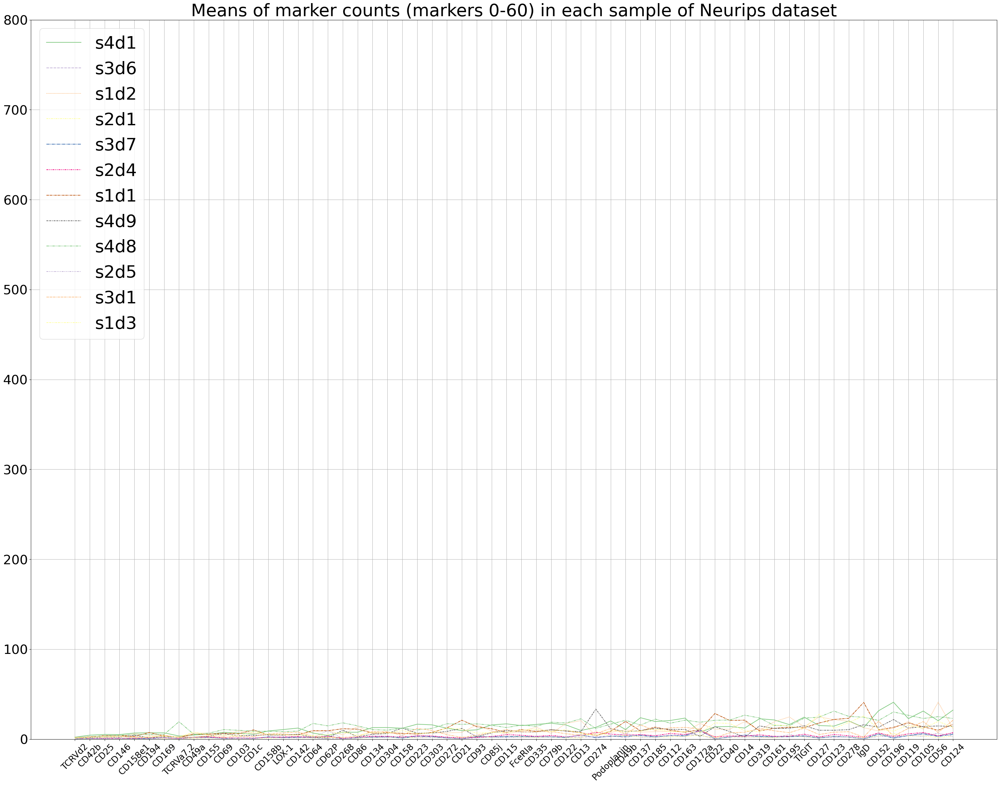

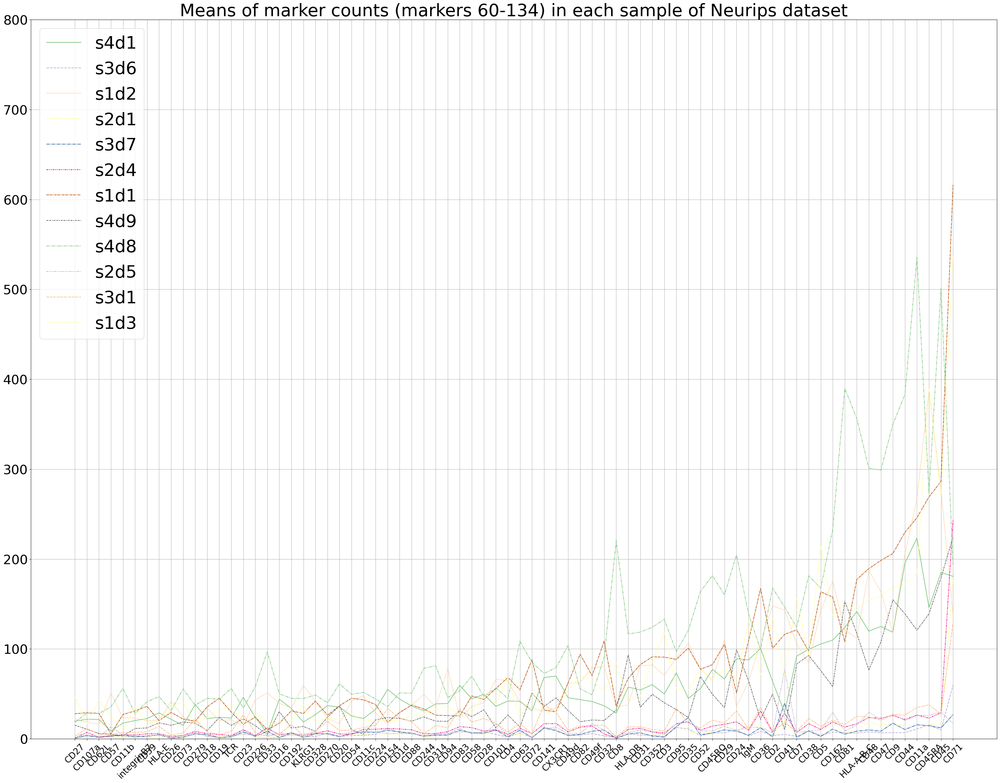

In [75]:
#only T-cells selected from each sample, raw protein counts

palette = sns.color_palette("Accent")


plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted.iloc[:60], palette=palette)
a.set_xticklabels(a.get_xticklabels(),rotation=45) 
a.tick_params(axis='x', labelsize=20)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 800)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of marker counts (markers 0-60) in each sample of Neurips dataset", fontsize=40) ;


plt.figure(figsize=[40,30])
b= sns.lineplot(data=df_sorted.iloc[60:], palette=palette)
b.set_xticklabels(b.get_xticklabels(),rotation=45) 
b.tick_params(axis='x', labelsize=20)
b.tick_params(axis='y', labelsize=30)
plt.ylim(0, 800)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of marker counts (markers 60-134) in each sample of Neurips dataset", fontsize=40) ;


In [78]:
df_sorted

,s4d1,s3d6,s1d2,s2d1,s3d7,s2d4,s1d1,s4d9,s4d8,s2d5,s3d1,s1d3
TCRVd2,2.134903,0.306805,2.080000,0.171314,0.268469,0.721311,1.382488,0.881645,1.301273,0.181089,1.006487,1.095679
CD42b,4.349846,0.832105,2.216854,0.659851,0.765044,0.866885,2.462285,1.684082,2.930693,1.131920,2.654282,1.751440
CD25,5.164995,0.687670,2.346742,0.722635,0.540826,0.788197,3.935484,2.201676,3.392362,0.473696,2.121845,2.873251
CD146,5.009212,0.899186,2.738652,0.677303,0.746991,0.878251,4.039049,2.191165,4.191796,0.601032,2.802902,3.026337
CD158e1,6.745343,0.905293,5.992360,0.568360,0.662007,0.983607,2.936697,4.058797,5.024894,1.879885,2.392192,1.584568
...,...,...,...,...,...,...,...,...,...,...,...,...
CD44,195.542068,6.931563,205.419326,14.907683,10.342529,21.494645,229.680330,139.070526,383.054314,20.283324,26.289573,171.890123
CD11a,223.299898,10.888232,267.175506,14.712825,15.705240,26.494208,246.075188,120.888500,535.727864,26.009054,35.023001,184.210700
CD45RA,146.030911,15.661981,388.055056,15.343660,14.607295,23.079563,269.213194,139.064585,272.985007,26.065903,37.894315,389.283745
CD45,185.177892,9.784994,277.178652,17.476766,12.233105,29.032787,286.345865,179.250114,500.854880,29.913238,27.404695,269.937449


In [81]:
sns.barplot(data=df_sorted.column["CD8"])

AttributeError: 'DataFrame' object has no attribute 'column'

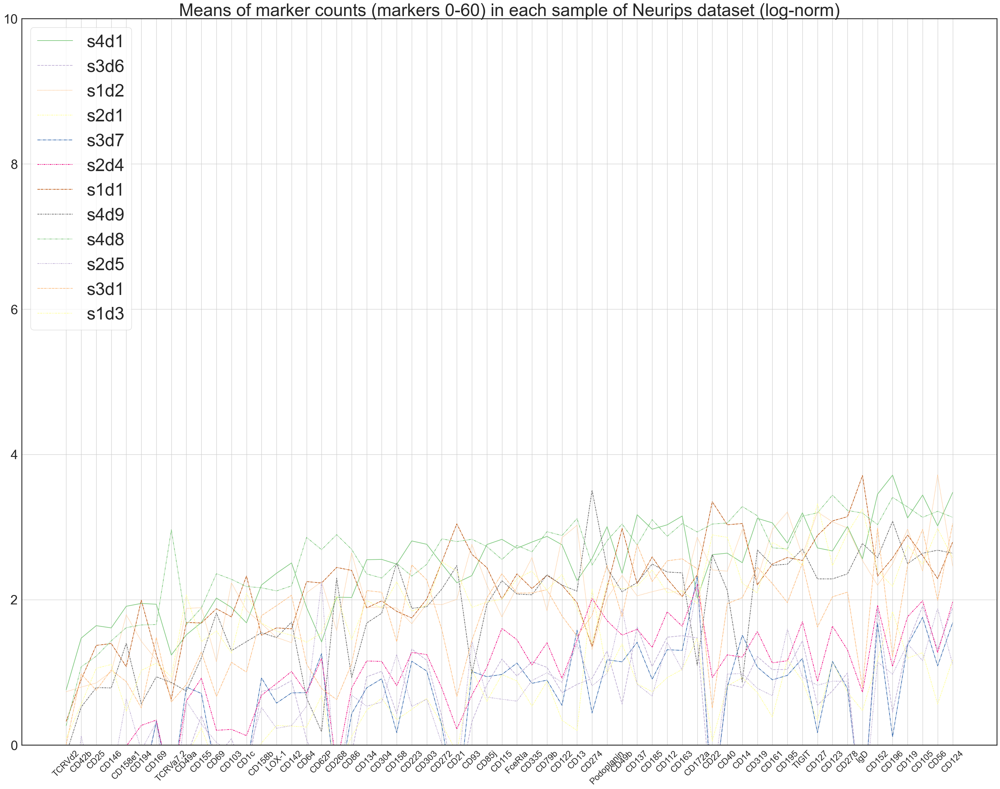

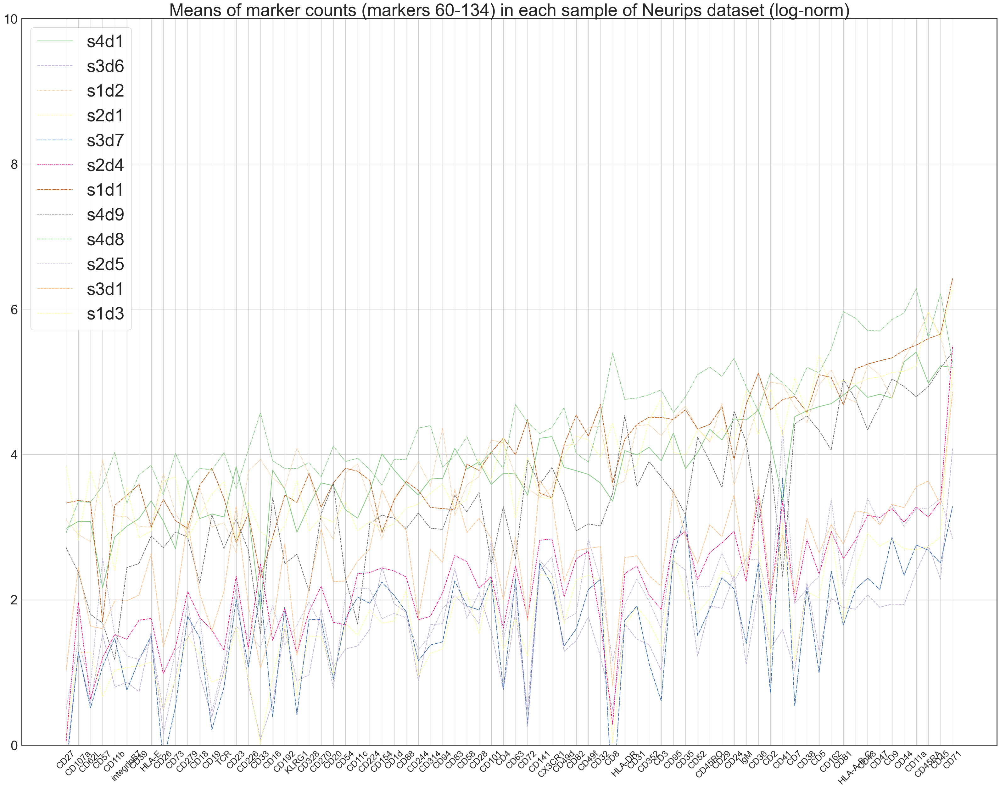

In [121]:
#only T-cells, log-normalized

palette = sns.color_palette("Accent")


plt.figure(figsize=[40,30])
a= sns.lineplot(data=np.log(df_sorted.iloc[:60]), palette=palette)
a.set_xticklabels(a.get_xticklabels(),rotation=45) 
a.tick_params(axis='x', labelsize=20)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 10)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of marker counts (markers 0-60) in each sample of Neurips dataset (log-norm)", fontsize=40) ;


plt.figure(figsize=[40,30])
b= sns.lineplot(data=np.log(df_sorted.iloc[60:]), palette=palette)
b.set_xticklabels(b.get_xticklabels(),rotation=45) 
b.tick_params(axis='x', labelsize=20)
b.tick_params(axis='y', labelsize=30)
plt.ylim(0, 10)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of marker counts (markers 60-134) in each sample of Neurips dataset (log-norm)", fontsize=40) ;



### Granja

In [122]:
samples_g=adata_granja.obs['POOL'].unique().tolist()
samples_g

['GSM4138872', 'GSM4138873', 'GSM4138874', 'GSM4138880', 'GSM4138885']

In [126]:
#save means of protein counts/each protein/each sample into a list

list_samples_g= []

for sample in samples_g:
    eg=adata_granja[adata_granja.obs['new_cell_type'] == 'T']
    eg=adata_granja[adata_granja.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples_g.append(prot_mean)

In [127]:
list_samples_g

[CD86         0.000000
 CD71         0.000000
 CD22         0.000000
 CD45         0.000000
 CD38         0.000000
              ...     
 CD14       239.110107
 CD8        768.157572
 CD3       1210.045851
 CD4       1327.041653
 CD45RA    1327.136099
 Length: 141, dtype: float64,
 CD86         0.000000
 CD71         0.000000
 CD22         0.000000
 CD45         0.000000
 CD38         0.000000
              ...     
 CD14       275.822795
 CD8        980.455098
 CD3       1395.397151
 CD4       1504.596286
 CD45RA    1539.095246
 Length: 141, dtype: float64,
 CD86         0.000000
 CD45         0.000000
 CD127        0.000000
 CD38         0.000000
 CD28         0.000000
              ...     
 CD8         38.200970
 CD10        86.559806
 CD123      121.290948
 CD45RA     369.761853
 CD34      1537.881466
 Length: 141, dtype: float64,
 CD86        0.000000
 CD45        0.000000
 CD127       0.000000
 CD38        0.000000
 CD28        0.000000
              ...    
 CD123      74.9131

In [128]:
#save column names
proteins=adata_granja.obsm['protein_expression'].columns

In [129]:
#creating a dataframe from list of lists

df_g= pd.DataFrame(list_samples_g, columns = proteins)

df_g

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,67.583791,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,79.380823,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1537.881466,86.559806,18.718750,0.000000,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,929.073813,3.409498,7.403992,0.000000,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,17.356532,0.088400,0.072772,0.000000,0.0,0.0


In [130]:
df_g=df_g.T

df_g

,0,1,2,3,4
CD86,0.000000,0.000000,0.000000,0.000000,0.000000
CD274,0.000000,0.000000,0.000000,0.000000,0.000000
CD270,0.000000,0.000000,0.000000,0.000000,0.000000
CD155,0.000000,0.000000,0.000000,0.000000,0.000000
CD112,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
CD10,0.000000,0.000000,86.559806,3.409498,0.088400
CD90,0.000000,0.000000,18.718750,7.403992,0.072772
CD15,67.583791,79.380823,0.000000,0.000000,0.000000
CD117,0.000000,0.000000,0.000000,0.000000,0.000000


In [131]:
#add column names

df_g.columns=samples_g

df_g

,GSM4138872,GSM4138873,GSM4138874,GSM4138880,GSM4138885
CD86,0.000000,0.000000,0.000000,0.000000,0.000000
CD274,0.000000,0.000000,0.000000,0.000000,0.000000
CD270,0.000000,0.000000,0.000000,0.000000,0.000000
CD155,0.000000,0.000000,0.000000,0.000000,0.000000
CD112,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
CD10,0.000000,0.000000,86.559806,3.409498,0.088400
CD90,0.000000,0.000000,18.718750,7.403992,0.072772
CD15,67.583791,79.380823,0.000000,0.000000,0.000000
CD117,0.000000,0.000000,0.000000,0.000000,0.000000


In [136]:
df_g=df_g.T

df_g

,GSM4138872,GSM4138873,GSM4138874,GSM4138880,GSM4138885
CD3,1210.045851,1395.397151,31.248922,11.111321,2.653968
CD8,768.157572,980.455098,38.200970,19.742085,7.613187
CD56,51.220375,62.482792,0.000000,0.000000,0.000000
CD19,71.825153,87.477989,29.991379,7.722815,0.109158
CD33,0.000000,0.000000,12.067349,207.355816,0.344078
CD45RA,1327.136099,1539.095246,369.761853,344.344288,12.971917
CD123,0.000000,0.000000,121.290948,74.913111,0.761661
CD7,0.000000,0.000000,14.382543,152.003097,3.504518
CD4,1327.041653,1504.596286,34.320043,14.696490,0.621734
CD14,239.110107,275.822795,1.158944,4.013076,0.146032


In [133]:
#remove columns that contain only zeros

df_g = pd.DataFrame(df_g)
df_g != 0
(df_g != 0).any(axis=0)
df_g.loc[:, (df_g != 0).any(axis=0)]
df_g = df_g.loc[:, (df_g != 0).any(axis=0)]

df_g

,CD3,CD8,CD56,CD19,CD33,CD45RA,CD123,CD7,CD4,CD14,CD16,CD25,CD45RO,CD279,TIGIT,CD127,CD34,CD10,CD90,CD15
GSM4138872,1210.045851,768.157572,51.220375,71.825153,0.000000,1327.136099,0.000000,0.000000,1327.041653,239.110107,82.381498,41.547304,228.395383,37.458185,13.650953,115.725541,0.000000,0.000000,0.000000,67.583791
GSM4138873,1395.397151,980.455098,62.482792,87.477989,0.000000,1539.095246,0.000000,0.000000,1504.596286,275.822795,99.337602,48.201697,260.707860,46.264767,15.792380,134.199616,0.000000,0.000000,0.000000,79.380823
GSM4138874,31.248922,38.200970,0.000000,29.991379,12.067349,369.761853,121.290948,14.382543,34.320043,1.158944,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1537.881466,86.559806,18.718750,0.000000
GSM4138880,11.111321,19.742085,0.000000,7.722815,207.355816,344.344288,74.913111,152.003097,14.696490,4.013076,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,929.073813,3.409498,7.403992,0.000000
GSM4138885,2.653968,7.613187,0.000000,0.109158,0.344078,12.971917,0.761661,3.504518,0.621734,0.146032,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.356532,0.088400,0.072772,0.000000


In [134]:
index_sort = df_g.mean().sort_values().index
df_sorted_g = df_g[index_sort]

df_sorted_g

,CD90,TIGIT,CD279,CD25,CD10,CD56,CD15,CD7,CD16,CD123,CD19,CD33,CD127,CD45RO,CD14,CD8,CD34,CD3,CD4,CD45RA
GSM4138872,0.000000,13.650953,37.458185,41.547304,0.000000,51.220375,67.583791,0.000000,82.381498,0.000000,71.825153,0.000000,115.725541,228.395383,239.110107,768.157572,0.000000,1210.045851,1327.041653,1327.136099
GSM4138873,0.000000,15.792380,46.264767,48.201697,0.000000,62.482792,79.380823,0.000000,99.337602,0.000000,87.477989,0.000000,134.199616,260.707860,275.822795,980.455098,0.000000,1395.397151,1504.596286,1539.095246
GSM4138874,18.718750,0.000000,0.000000,0.000000,86.559806,0.000000,0.000000,14.382543,0.000000,121.290948,29.991379,12.067349,0.000000,0.000000,1.158944,38.200970,1537.881466,31.248922,34.320043,369.761853
GSM4138880,7.403992,0.000000,0.000000,0.000000,3.409498,0.000000,0.000000,152.003097,0.000000,74.913111,7.722815,207.355816,0.000000,0.000000,4.013076,19.742085,929.073813,11.111321,14.696490,344.344288
GSM4138885,0.072772,0.000000,0.000000,0.000000,0.088400,0.000000,0.000000,3.504518,0.000000,0.761661,0.109158,0.344078,0.000000,0.000000,0.146032,7.613187,17.356532,2.653968,0.621734,12.971917


In [138]:
df_sorted_g=df_sorted_g.T

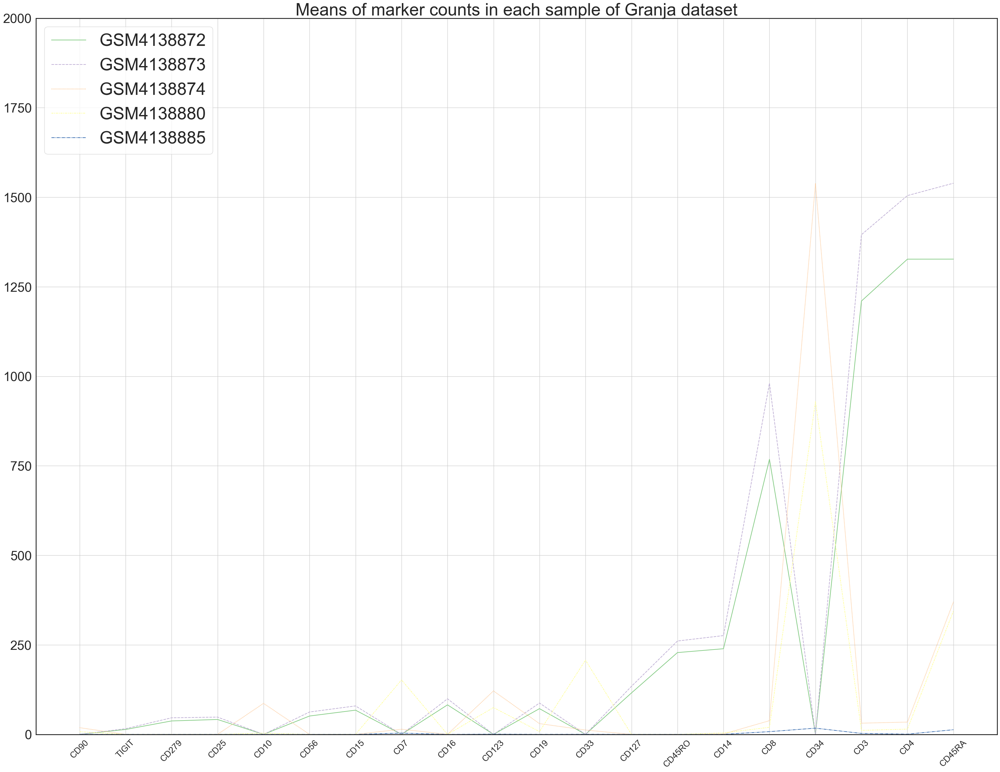

In [140]:
#Only T-cells from each sample selected, raw counts

palette = sns.color_palette("Accent")


plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted_g, palette=palette)
a.set_xticklabels(a.get_xticklabels(),rotation=45) 
a.tick_params(axis='x', labelsize=20)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 2000)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of marker counts in each sample of Granja dataset", fontsize=40) ;




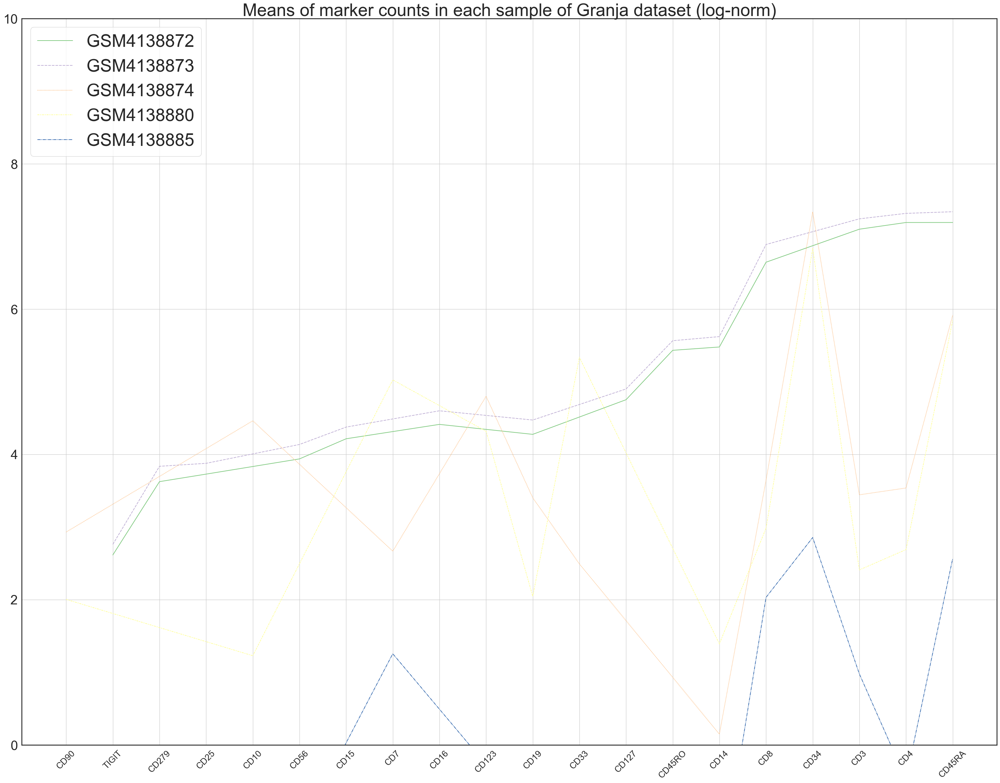

In [143]:
#Only T-cells from each sample selected, log-normalized

palette = sns.color_palette("Accent")


plt.figure(figsize=[40,30])
a= sns.lineplot(data=np.log(df_sorted_g), palette=palette)
a.set_xticklabels(a.get_xticklabels(),rotation=45) 
a.tick_params(axis='x', labelsize=20)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 10)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of marker counts in each sample of Granja dataset (log-norm)", fontsize=40) ;





### Easigenomics

In [146]:
samples_e=adata_f.obs['POOL'].unique().tolist()
samples_e

['EG35',
 'EG38',
 'EG58',
 'EG39',
 'EG4',
 'EG48',
 'EG23',
 'EG36',
 'EG61',
 'EG3',
 'EG12',
 'EG46',
 'EG9',
 'EG43',
 'EG56',
 'EG42',
 'EG49',
 'EG37',
 'EG57',
 'EG24',
 'EG11',
 'EG14',
 'EG55',
 'EG28',
 'EG52',
 'EG33',
 'EG10',
 'EG32',
 'EG59',
 'EG16',
 'EG63',
 'EG15',
 'EG21',
 'EG26',
 'EG13',
 'EG53',
 'EG51',
 'EG2',
 'EG40',
 'EG62',
 'EG31',
 'EG7',
 'EG8',
 'EG29',
 'EG41',
 'EG47',
 'EG1',
 'EG6',
 'EG34',
 'EG30',
 'EG60',
 'EG44',
 'EG27',
 'EG22',
 'EG54',
 'EG45',
 'EG5',
 'EG50',
 'EG25']

In [148]:
#save means of protein counts/each protein/each sample into a list

list_samples_e= []

for sample in samples_e:
    eg=adata_f[adata_f.obs['new_cell_type'] == 'T']
    eg=adata_f[adata_f.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples_e.append(prot_mean)

In [149]:
list_samples_e

[CD86        0.000000
 CD22        0.000000
 CD28        0.000000
 CD18        0.000000
 IgD         0.000000
              ...    
 CD7        57.807130
 HLA-DR     67.666819
 CD45      108.556673
 CD2       148.609689
 CD44      364.187843
 Length: 141, dtype: float64,
 CD86       0.000000
 CD22       0.000000
 CD28       0.000000
 CD18       0.000000
 IgD        0.000000
             ...    
 HLA-DR    25.330396
 CD34      28.616740
 CD45      30.616740
 CD117     51.919236
 CD44      95.715125
 Length: 141, dtype: float64,
 CD86        0.000000
 CD22        0.000000
 CD28        0.000000
 CD18        0.000000
 IgD         0.000000
              ...    
 CD11c      92.350251
 HLA-DR     92.416080
 CD2        94.780402
 CD11b      98.874623
 CD44      539.432663
 Length: 141, dtype: float64,
 CD86        0.000000
 CD22        0.000000
 CD28        0.000000
 CD18        0.000000
 IgD         0.000000
              ...    
 HLA-DR     30.739505
 CD58       31.079377
 CD33       33.5374

In [150]:
#save column names
proteins=adata_f.obsm['protein_expression'].columns

In [151]:
#creating a dataframe from list of lists

df_e= pd.DataFrame(list_samples_e, columns = proteins)

df_e

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,19.853748,27.609689,17.835923,0.0,45.230347,11.039305,25.171389
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,5.430250,28.616740,24.516887,0.0,22.212922,51.919236,7.920705
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,7.022362,14.089196,13.256281,0.0,25.310804,5.566332,11.340704
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,5.685426,21.725023,20.193401,0.0,23.646196,44.226948,8.818332
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3.507246,32.066793,25.665406,0.0,26.787020,36.029616,3.195337
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,12.599769,68.324106,31.208766,0.0,51.486736,49.859285,19.748558
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,5.085714,41.914286,482.000000,0.0,23.285714,5.142857,9.914286
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,16.038266,29.473490,23.413094,0.0,64.183956,13.587828,19.535270
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,9.783784,37.959459,13.193694,0.0,20.344595,28.083333,9.209459
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4.862595,14.916031,23.351145,0.0,30.244275,13.778626,3.175573


In [152]:
df_e=df_e.T

df_e

,0,1,2,3,4,5,6,7,8,9,...,49,50,51,52,53,54,55,56,57,58
CD86,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD274,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD270,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD155,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD112,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CD10,17.835923,24.516887,13.256281,20.193401,25.665406,31.208766,482.000000,23.413094,13.193694,23.351145,...,20.355525,11.922512,33.346493,26.859020,523.375102,10.680851,17.156142,17.603387,13.533304,989.278822
CD90,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD15,45.230347,22.212922,25.310804,23.646196,26.787020,51.486736,23.285714,64.183956,20.344595,30.244275,...,25.026424,15.473614,41.226295,8.967742,8.077259,18.691489,61.583267,6.987297,66.317370,14.218672
CD117,11.039305,51.919236,5.566332,44.226948,36.029616,49.859285,5.142857,13.587828,28.083333,13.778626,...,13.635209,9.847027,37.679591,16.663082,9.048321,9.617021,138.709566,13.048694,75.934697,5.573308


In [153]:
#add column names

df_e.columns=samples_e

df_e

,EG35,EG38,EG58,EG39,EG4,EG48,EG23,EG36,EG61,EG3,...,EG30,EG60,EG44,EG27,EG22,EG54,EG45,EG5,EG50,EG25
CD86,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD274,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD270,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD155,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD112,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CD10,17.835923,24.516887,13.256281,20.193401,25.665406,31.208766,482.000000,23.413094,13.193694,23.351145,...,20.355525,11.922512,33.346493,26.859020,523.375102,10.680851,17.156142,17.603387,13.533304,989.278822
CD90,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD15,45.230347,22.212922,25.310804,23.646196,26.787020,51.486736,23.285714,64.183956,20.344595,30.244275,...,25.026424,15.473614,41.226295,8.967742,8.077259,18.691489,61.583267,6.987297,66.317370,14.218672
CD117,11.039305,51.919236,5.566332,44.226948,36.029616,49.859285,5.142857,13.587828,28.083333,13.778626,...,13.635209,9.847027,37.679591,16.663082,9.048321,9.617021,138.709566,13.048694,75.934697,5.573308


In [158]:
df_e=df_e.T

In [159]:
#remove columns that contain only zeros

df_e = pd.DataFrame(df_e)
df_e != 0
(df_e != 0).any(axis=0)
df_e.loc[:, (df_e != 0).any(axis=0)]
df_e = df_e.loc[:, (df_e != 0).any(axis=0)]

df_e

,CD3,CD8,CD56,CD19,CD33,CD11c,CD45RA,CD123,CD7,CD4,...,CD38,CD127,CD45,CD73,CD197,CD34,CD10,CD15,CD117,CD66ace
EG35,18.578611,43.312157,22.443784,16.783821,24.679616,51.629799,25.041133,24.520110,57.807130,32.861060,...,21.177331,13.265996,108.556673,14.062157,19.853748,27.609689,17.835923,45.230347,11.039305,25.171389
EG38,14.562408,7.562408,12.057269,13.621145,7.303965,8.571219,4.766520,18.572687,9.767988,9.767988,...,5.092511,3.807636,30.616740,23.121880,5.430250,28.616740,24.516887,22.212922,51.919236,7.920705
EG58,5.847236,18.293467,18.602010,7.913065,58.515075,92.350251,12.280151,24.932161,37.785176,35.903015,...,21.204523,8.011055,90.245729,5.664070,7.022362,14.089196,13.256281,25.310804,5.566332,11.340704
EG39,14.927773,11.250779,13.330522,13.129423,33.537489,10.302841,6.557287,17.548854,17.221815,17.007333,...,6.729789,4.364620,29.461595,24.818698,5.685426,21.725023,20.193401,23.646196,44.226948,8.818332
EG4,11.738500,9.575299,18.284184,12.452426,21.395085,13.327662,37.498425,8.127914,695.281033,8.604285,...,43.705104,9.117832,42.608696,15.670447,3.507246,32.066793,25.665406,26.787020,36.029616,3.195337
EG48,11.963091,11.904844,21.378316,25.118224,30.311995,148.779700,30.147636,40.224913,23.632641,40.268743,...,38.771626,12.000000,152.713379,9.731834,12.599769,68.324106,31.208766,51.486736,49.859285,19.748558
EG23,17.971429,18.771429,14.371429,17.971429,28.342857,34.200000,7.942857,12.085714,13.828571,12.942857,...,8.028571,5.142857,40.314286,30.542857,5.085714,41.914286,482.000000,23.285714,5.142857,9.914286
EG36,27.595205,129.548179,29.053481,15.448594,21.774550,42.950207,47.769018,18.878285,108.093130,39.521438,...,25.890733,14.944675,174.263716,11.470263,16.038266,29.473490,23.413094,64.183956,13.587828,19.535270
EG61,6.790541,16.488739,16.567568,9.454955,37.936937,56.056306,18.722973,20.966216,11.831081,28.590090,...,13.166667,9.759009,58.898649,7.117117,9.783784,37.959459,13.193694,20.344595,28.083333,9.209459
EG3,15.687023,41.709924,16.816794,4.167939,8.793893,5.847328,28.251908,6.213740,108.755725,58.839695,...,9.374046,11.587786,113.000000,8.778626,4.862595,14.916031,23.351145,30.244275,13.778626,3.175573


In [160]:
index_sort = df_e.mean().sort_values().index
df_sorted_e = df_e[index_sort]

df_sorted_e

,CD24,CD13,CD197,CD3,CD127,CD45RO,CD66ace,CD20,CD64,CD45RA,...,CD15,CD11c,CD11b,CD34,CD45,HLA-DR,CD7,CD10,CD2,CD44
EG35,10.630256,8.444241,19.853748,18.578611,13.265996,20.567642,25.171389,28.659049,15.727148,25.041133,...,45.230347,51.629799,44.530165,27.609689,108.556673,67.666819,57.807130,17.835923,148.609689,364.187843
EG38,2.883994,2.091043,5.430250,14.562408,3.807636,6.585903,7.920705,5.688693,6.814978,4.766520,...,22.212922,8.571219,11.384728,28.616740,30.616740,25.330396,9.767988,24.516887,17.493392,95.715125
EG58,5.648744,17.496734,7.022362,5.847236,8.011055,12.563568,11.340704,17.788442,28.544975,12.280151,...,25.310804,92.350251,98.874623,14.089196,90.245729,92.416080,37.785176,13.256281,94.780402,539.432663
EG39,3.780385,3.527039,5.685426,14.927773,4.364620,7.722090,8.818332,6.394684,7.224381,6.557287,...,23.646196,10.302841,10.551421,21.725023,29.461595,30.739505,17.221815,20.193401,26.689276,218.990101
EG4,2.107120,2.559546,3.507246,11.738500,9.117832,5.640832,3.195337,4.485822,2.161941,37.498425,...,26.787020,13.327662,49.220542,32.066793,42.608696,10.933837,695.281033,25.665406,221.383113,196.340895
EG48,9.903691,8.778547,12.599769,11.963091,12.000000,24.964245,19.748558,31.369666,25.377163,30.147636,...,51.486736,148.779700,115.777970,68.324106,152.713379,176.389850,23.632641,31.208766,43.549020,1040.684544
EG23,5.771429,4.828571,5.085714,17.971429,5.142857,7.885714,9.914286,18.628571,10.085714,7.942857,...,23.285714,34.200000,43.371429,41.914286,40.314286,30.200000,13.828571,482.000000,23.571429,209.200000
EG36,10.983864,7.361457,16.038266,27.595205,14.944675,27.217151,19.535270,20.118027,12.365606,47.769018,...,64.183956,42.950207,48.255417,29.473490,174.263716,48.963117,108.093130,23.413094,324.981097,534.041033
EG61,7.096847,6.168919,9.783784,6.790541,9.759009,13.817568,9.209459,16.891892,20.445946,18.722973,...,20.344595,56.056306,35.184685,37.959459,58.898649,201.655405,11.831081,13.193694,36.677928,727.259009
EG3,2.137405,2.381679,4.862595,15.687023,11.587786,9.832061,3.175573,5.053435,1.412214,28.251908,...,30.244275,5.847328,32.572519,14.916031,113.000000,13.839695,108.755725,23.351145,176.748092,464.389313


In [161]:
df_sorted_e=df_sorted_e.T

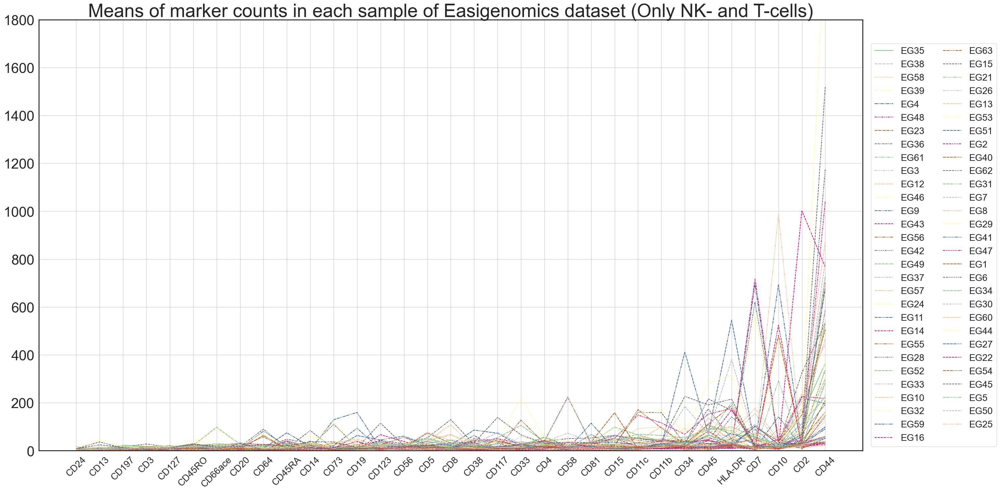

In [163]:
#only NK- and T-cells selected from each sample, raw protein counts

palette = sns.color_palette("Accent")

plt.figure(figsize=[30,15])
ax = sns.lineplot(data=df_sorted_e, palette=palette)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=20, rotation=45)
ax.tick_params(axis='y', labelsize=30)
plt.grid()
plt.ylim(0, 1800)
plt.title("Means of marker counts in each sample of Easigenomics dataset (Only NK- and T-cells)", fontsize=40) ;

plt.tight_layout()

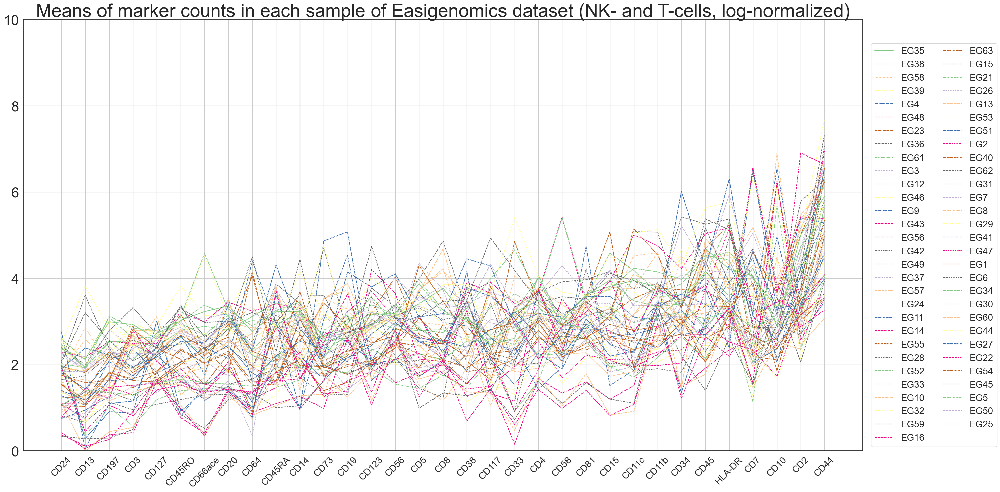

In [166]:
#only NK- and T-cells selected from each sample, log-normalized protein counts

palette = sns.color_palette("Accent")

plt.figure(figsize=[30,15])
ax = sns.lineplot(data=np.log(df_sorted_e), palette=palette)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=20, rotation=45)
ax.tick_params(axis='y', labelsize=30)
plt.grid()
plt.ylim(0, 10)
plt.title("Means of marker counts in each sample of Easigenomics dataset (NK- and T-cells, log-normalized)", fontsize=40) ;

plt.tight_layout()

### Seurat

In [170]:
samples_s=adata_s.obs['POOL'].unique().tolist()
samples_s

['Seurat']

In [171]:
adata_s.obs

,cell_type,n_genes,percent_mito,percent_ribo,n_counts,leiden_r2,leiden_r2_n_genes_MAD_diff,leiden_r2_n_counts_MAD_diff,leiden_r2_percent_mito_MAD_diff,filter,...,SAMPLE_SET,SAMPLE_TYPE,SAMPLE_TISSUE,DIAGNOSIS,SUBTYPE,STATUS,eg_code,leiden_r1,new_cell_type,batch_group
a_AAACCTGAGCTTATCG-1,Prog_RBC,2136,0.047442,0.446329,7546.0,13,0.603175,0.244040,0.844263,False,...,S,dg,BM,healthy,healthy,NaN,NaN,11,Prog,Seurat
a_AAACCTGAGGTGGGTT-1,gdT,437,0.044704,0.470360,1029.0,4,3.126482,2.740354,1.740952,False,...,S,dg,BM,healthy,healthy,NaN,NaN,5,T,Seurat
a_AAACCTGAGTACATGA-1,CD4 Naive,429,0.029703,0.492349,1111.0,5,2.744681,2.606061,0.093390,False,...,S,dg,BM,healthy,healthy,NaN,NaN,1,T,Seurat
a_AAACCTGCAAACCTAC-1,CD4 Memory,851,0.030281,0.470266,2741.0,16,0.789474,0.830769,1.482072,False,...,S,dg,BM,healthy,healthy,NaN,NaN,5,T,Seurat
a_AAACCTGCAAGGTGTG-1,CD14 Mono,843,0.050977,0.273940,2099.0,1,0.716312,0.643443,0.371991,False,...,S,dg,BM,healthy,healthy,NaN,NaN,0,Myel,Seurat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b_TTTGTCATCCGAGCCA-1,CD4 Memory,895,0.045000,0.464667,3000.0,4,0.494071,0.428457,1.786002,False,...,S,dg,BM,healthy,healthy,NaN,NaN,5,T,Seurat
b_TTTGTCATCCGTAGGC-1,CD4 Naive,649,0.026009,0.514798,2230.0,5,0.404255,0.183983,0.702805,False,...,S,dg,BM,healthy,healthy,NaN,NaN,1,T,Seurat
b_TTTGTCATCCTCGCAT-1,CD16 Mono,1457,0.050493,0.229920,4258.0,18,0.988235,0.686747,0.054326,False,...,S,dg,BM,healthy,healthy,NaN,NaN,21,Myel,Seurat
b_TTTGTCATCGCCGTGA-1,CD4 Naive,733,0.021526,0.515483,2648.0,5,0.489362,0.720779,1.442433,False,...,S,dg,BM,healthy,healthy,NaN,NaN,1,T,Seurat


In [174]:
#save means of protein counts/each protein/each sample into a list

list_samples_s= []

for sample in samples_s:
    eg=adata_s[adata_s.obs['new_cell_type'] == 'T']
    eg=adata_s[adata_s.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples_s.append(prot_mean)

list_samples_s

[CD86       0.000000
 CD71       0.000000
 CD22       0.000000
 CD45       0.000000
 CD18       0.000000
             ...    
 CD4      379.623799
 CD27     386.752842
 CD8      689.009101
 CD3      696.089965
 CD11a    804.665584
 Length: 141, dtype: float64]

In [175]:
#save column names
proteins=adata_s.obsm['protein_expression'].columns



In [176]:
#creating a dataframe from list of lists

df_s= pd.DataFrame(list_samples_s, columns = proteins)

df_s


,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,16.512789,23.47547,0.0,0.0,0.0,0.0,0.0


In [177]:
df_s=df_s.T

df_s


,0
CD86,0.0
CD274,0.0
CD270,0.0
CD155,0.0
CD112,0.0
...,...
CD10,0.0
CD90,0.0
CD15,0.0
CD117,0.0


In [178]:
#add column names

df_s.columns=samples_s

df_s


,Seurat
CD86,0.0
CD274,0.0
CD270,0.0
CD155,0.0
CD112,0.0
...,...
CD10,0.0
CD90,0.0
CD15,0.0
CD117,0.0


In [179]:
df_s=df_s.T

In [180]:
#remove columns that contain only zeros

df_s = pd.DataFrame(df_s)
df_s != 0
(df_s != 0).any(axis=0)
df_s.loc[:, (df_s != 0).any(axis=0)]
df_s = df_s.loc[:, (df_s != 0).any(axis=0)]

df_s

,CD3,CD8,CD56,CD19,CD11c,CD45RA,CD123,CD4,CD14,CD16,...,HLA-DR,CD57,CD278,CD11a,CD79b,CD28,CD38,CD127,CD197,CD34
Seurat,696.089965,689.009101,9.365104,58.929185,252.408817,363.024158,34.727805,379.623799,103.111517,123.946745,...,173.32863,29.061646,50.058601,804.665584,11.389329,50.321728,165.006767,81.150494,16.512789,23.47547


In [181]:
#sorting by mean

index_sort = df_s.mean().sort_values().index
df_sorted_s = df_s[index_sort]

df_sorted_s

,CD25,CD56,CD79b,CD197,CD161,CD34,CD45RO,CD57,CD123,CD278,...,CD16,CD38,HLA-DR,CD11c,CD45RA,CD4,CD27,CD8,CD3,CD11a
Seurat,7.125592,9.365104,11.389329,16.512789,23.423636,23.47547,28.320375,29.061646,34.727805,50.058601,...,123.946745,165.006767,173.32863,252.408817,363.024158,379.623799,386.752842,689.009101,696.089965,804.665584


In [188]:
df_sorted_s=df_sorted_s.T

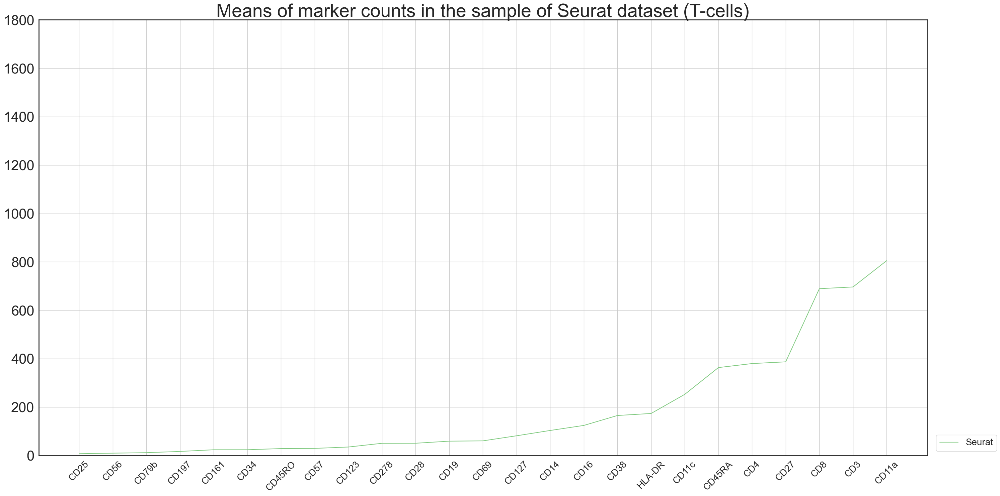

In [191]:
#only T-cells selected from each sample, raw protein counts

palette = sns.color_palette("Accent")

plt.figure(figsize=[30,15])
ax = sns.lineplot(data=df_sorted_s, palette=palette)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=20, rotation=45)
ax.tick_params(axis='y', labelsize=30)
plt.grid()
plt.ylim(0, 1800)
plt.title("Means of marker counts in the sample of Seurat dataset (T-cells)", fontsize=40) ;

plt.tight_layout()


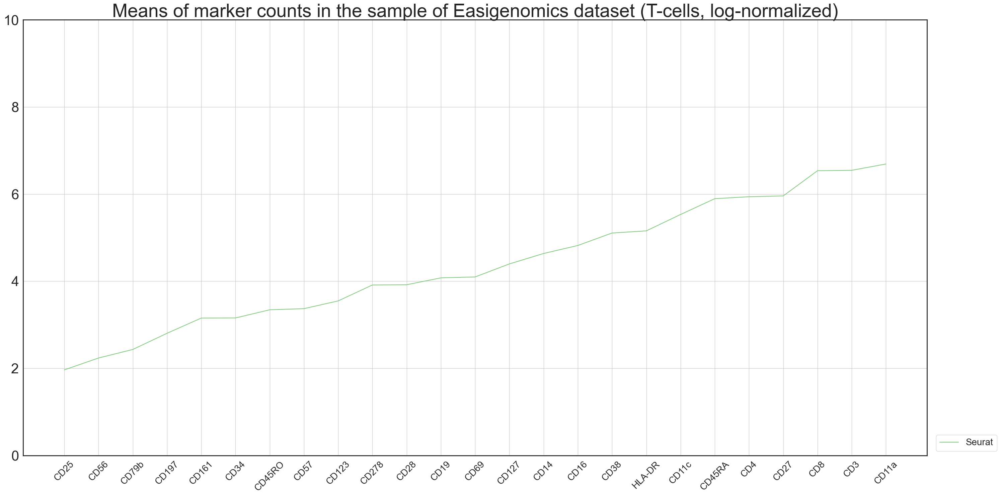

In [192]:
#only T-cells selected from each sample, log-normalized protein counts

palette = sns.color_palette("Accent")

plt.figure(figsize=[30,15])
ax = sns.lineplot(data=np.log(df_sorted_s), palette=palette)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=20, rotation=45)
ax.tick_params(axis='y', labelsize=30)
plt.grid()
plt.ylim(0, 10)
plt.title("Means of marker counts in the sample of Easigenomics dataset (T-cells, log-normalized)", fontsize=40) ;

plt.tight_layout()